In [1]:
import numpy as np
import mne 
import scipy 
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.svm import SVC

In [2]:
raw_data=mne.io.read_raw_brainvision('../../ks/NeoRec_2022-12-06_19-45-11.vhdr', preload=True)

Extracting parameters from ../../ks/NeoRec_2022-12-06_19-45-11.vhdr...
Setting channel info structure...
Reading 0 ... 1865409  =      0.000 ...   932.705 secs...


In [35]:
events,ids=mne.events_from_annotations(raw_data)

Used Annotations descriptions: ['1/Event', 'New Segment/']


In [43]:
raw_data

<RawBrainVision | NeoRec_2022-12-06_19-45-11.eeg, 15 x 1865410 (932.7 s), ~213.5 MB, data loaded>

In [44]:



raw_data.crop(events[-1,0]/raw_data.info['sfreq'], None)

<RawBrainVision | NeoRec_2022-12-06_19-45-11.eeg, 15 x 1862819 (931.4 s), ~213.2 MB, data loaded>

In [45]:
raw_data

<RawBrainVision | NeoRec_2022-12-06_19-45-11.eeg, 15 x 1862819 (931.4 s), ~213.2 MB, data loaded>

<IPython.core.display.Javascript object>


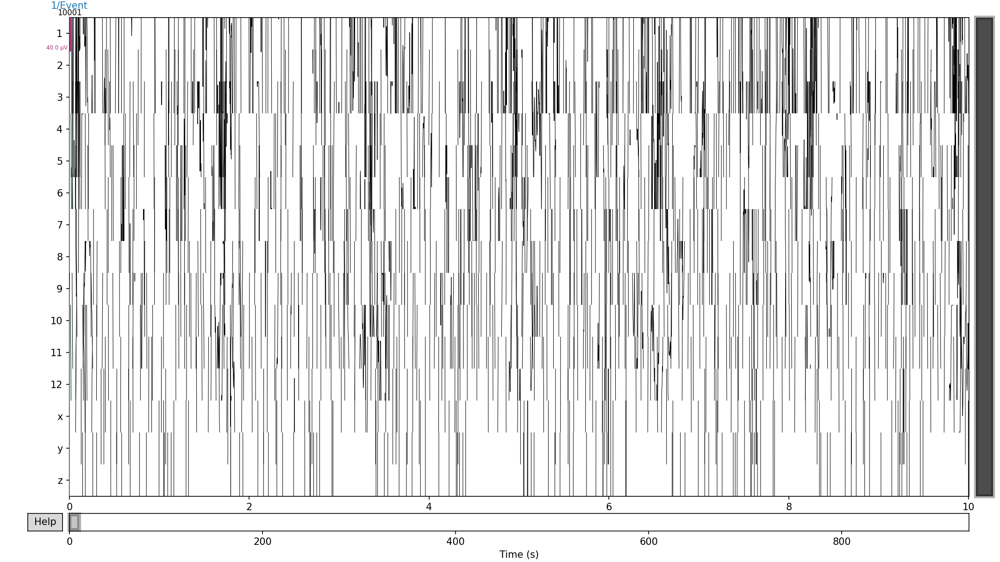

<IPython.core.display.Javascript object>


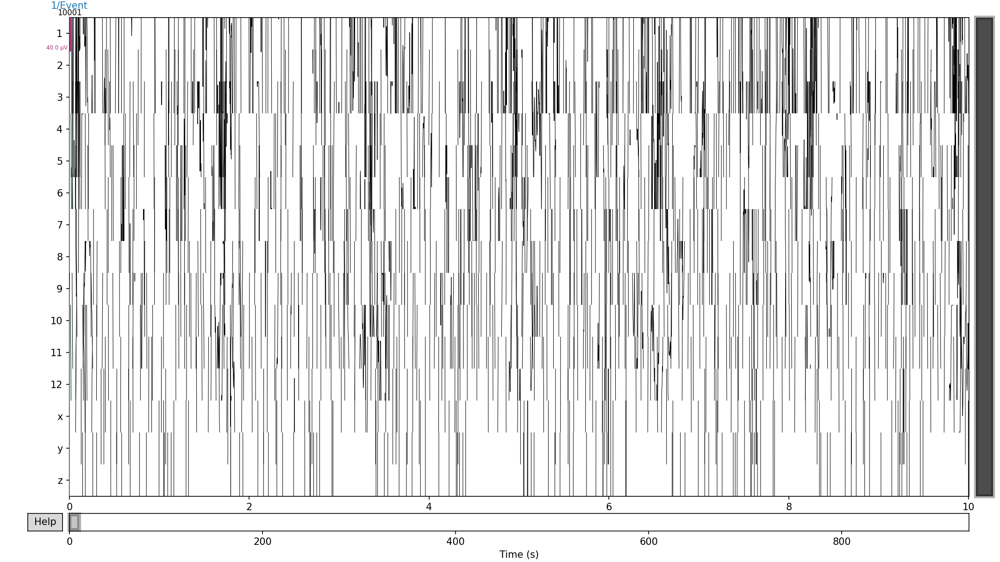

In [46]:
raw_data.plot(events)

In [47]:
raw_data.ch_names

['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', 'x', 'y', 'z']

In [48]:
raw_data_acc=raw_data.copy().drop_channels(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12'])

<IPython.core.display.Javascript object>


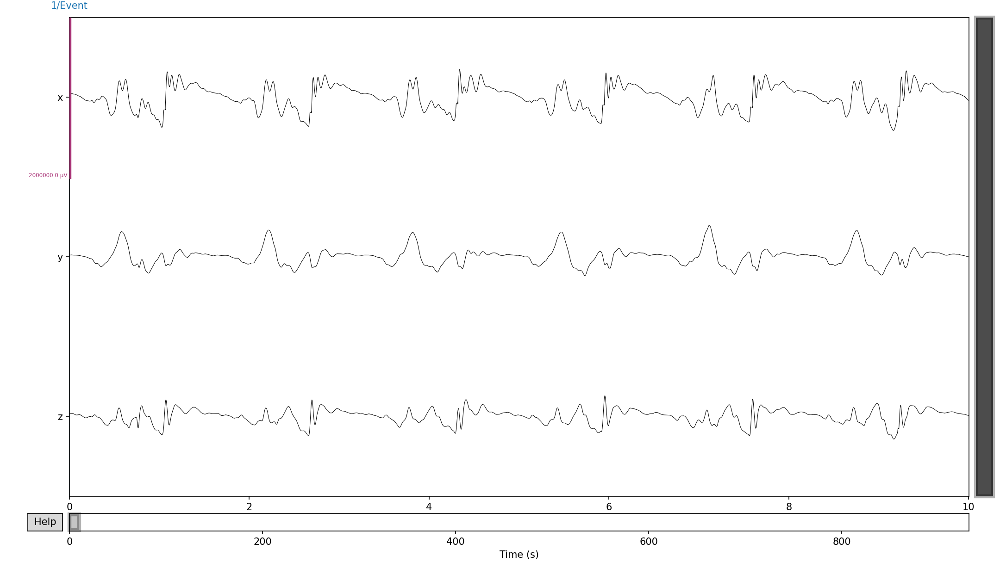

<function matplotlib.pyplot.show(block=None)>

In [49]:
raw_data_acc.plot(scalings={'eeg':0.1e1})
plt.show

In [50]:
xyz=raw_data_acc.get_data()


In [51]:
y_data=xyz[1,:]

In [66]:

start=0
period=3200
end=start+period


In [93]:
raw_data.info

<Info | 7 non-empty values
 bads: []
 ch_names: 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, x, y, z
 chs: 15 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 1000.0 Hz
 meas_date: unspecified
 nchan: 15
 projs: []
 sfreq: 2000.0 Hz
>

In [112]:
ax[0].legend?

Object `legend` not found.


In [ ]:
ax[0].legend

In [ ]:
ax[0].legend

<IPython.core.display.Javascript object>


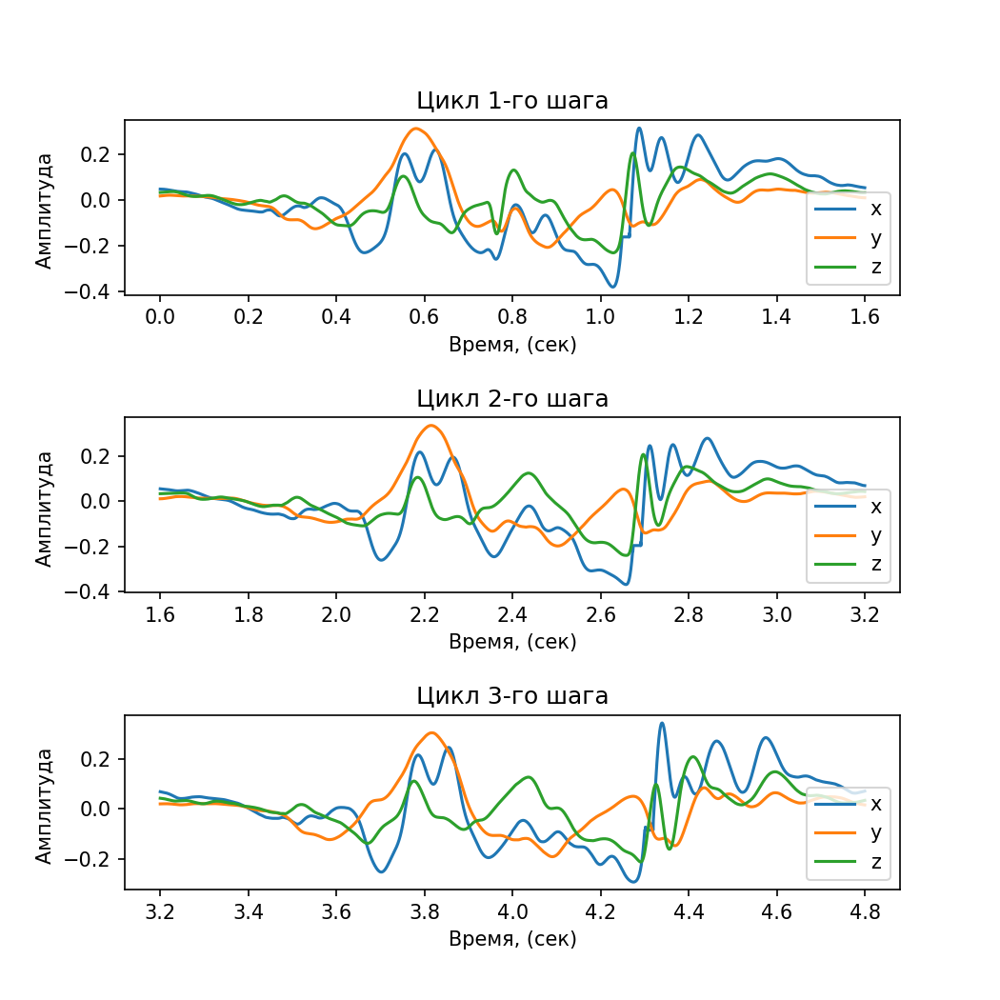

In [118]:
plt.close()

fig,ax=plt.subplots(3,1, figsize=(7,7))
plt.subplots_adjust(hspace=0.7)

ax[0].plot(np.arange(start,end)/raw_data.info['sfreq'],  xyz[:,start:end].T , label=['x', 'y', 'z'])



ax[0].set_title('Цикл 1-го шага')
ax[0].set_xlabel('Время, (сек)')
ax[0].set_ylabel('Амплитуда ')
ax[0].legend(loc='lower right')



ax[1].plot( np.arange(start+period*1,end+period*1)/raw_data.info['sfreq'],  xyz[:,start+period*1:end+period*1].T  , label=['x', 'y', 'z'])
ax[1].set_title('Цикл 2-го шага')
ax[1].set_xlabel('Время, (сек)')
ax[1].set_ylabel('Амплитуда ')
ax[1].legend(loc='lower right')

ax[2].plot(np.arange(start+period*2,end+period*2)/raw_data.info['sfreq'],  xyz[:,start+period*2:end+period*2].T , label=['x', 'y', 'z'])
ax[2].set_title('Цикл 3-го шага')
ax[2].set_xlabel('Время, (сек)')
ax[2].set_ylabel('Амплитуда ')
ax[2].legend(loc='lower right')


In [119]:
out=np.convolve(y_data,xyz[1,start:end], 'same')



<IPython.core.display.Javascript object>


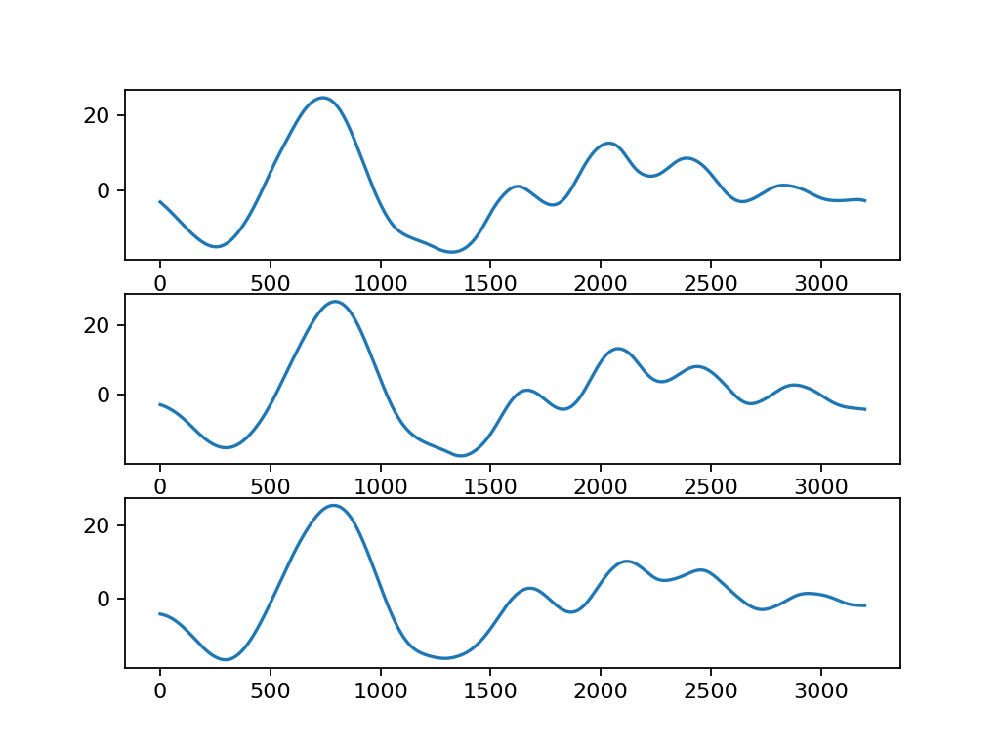

In [120]:
plt.close()

fig,ax=plt.subplots(3,1)
ax[0].plot(out[start+period*0:end+period*0].T)
ax[1].plot(out[start+period*1:end+period*1].T)
ax[2].plot(out[start+period*2:end+period*2].T)

In [121]:
start

0

<IPython.core.display.Javascript object>


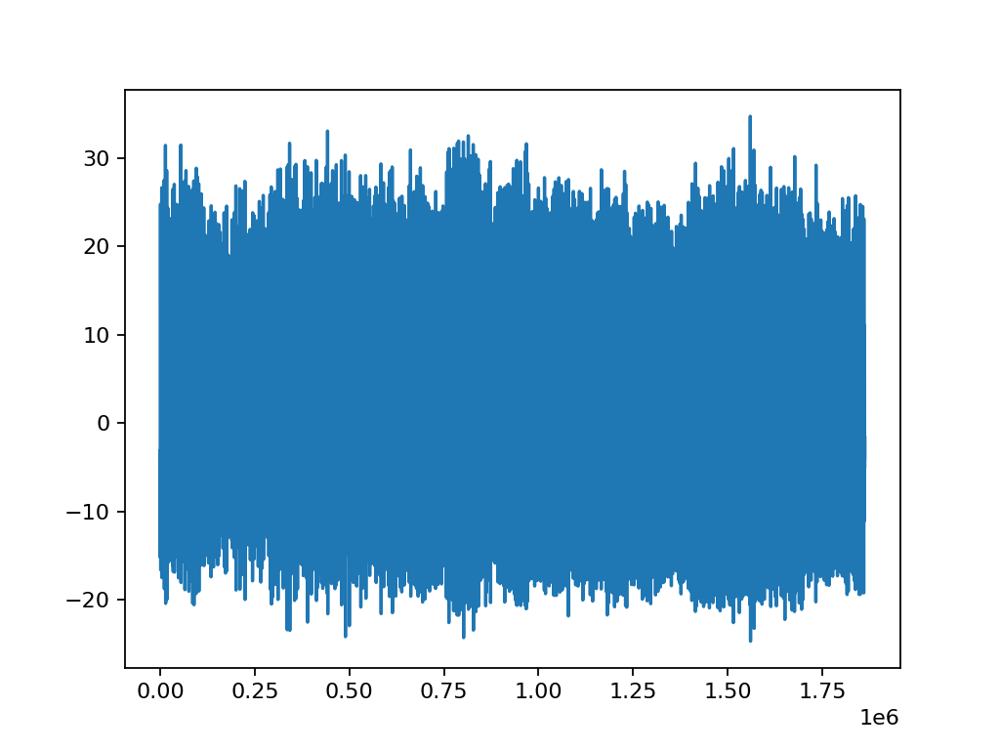

In [122]:
plt.close()
plt.plot(out)

In [123]:
def find_peaks(array_, koef=1.1, max_flg=False):

    mean_=np.mean(array_)
    std_=np.std(array_)

    max_=mean_+koef*std_
    min_=mean_-koef*std_

    max_array_=[max_]*len(array_)
    min_array_=[min_]*len(array_)

    inds=np.where(array_>max_)[0]
    
    if max_flg:
        return inds, max_
    
    else:
        return inds
    
    
def find_peaks_min(array_, koef=1.1, max_flg=False):

    mean_=np.mean(array_)
    std_=np.std(array_)

    max_=mean_+koef*std_
    min_=mean_-koef*std_

    max_array_=[max_]*len(array_)
    min_array_=[min_]*len(array_)

    inds=np.where(array_<min_)[0]
    
    if max_flg:
        return inds, min_
    
    else:
        return inds
    
def reduce_peaks(marks_array_inds,  threhold, with_log=False,):
    
    new_marks_array_inds=[marks_array_inds[0]]
    for i in range(1,len(marks_array_inds)):
        if marks_array_inds[i]-new_marks_array_inds[-1]<threhold:
            if with_log:
                print(i)
        else:
            new_marks_array_inds.append(marks_array_inds[i])

    return new_marks_array_inds


In [127]:
inds=find_peaks(out,1.7)

<IPython.core.display.Javascript object>


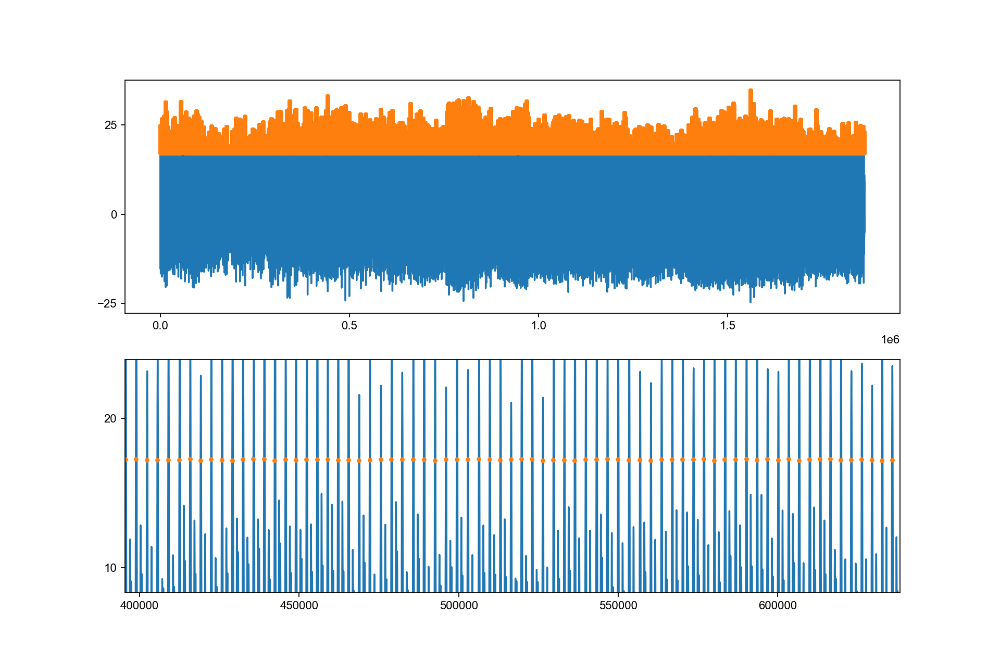

In [128]:
plt.close()
fig,ax=plt.subplots(2,1, figsize=(12,8))
ax[0].plot(out)
ax[0].plot(inds,out[inds], '.')

new_peaks=reduce_peaks(inds, 2000)
ax[1].plot(out)
ax[1].plot(new_peaks,out[new_peaks], '.')

In [132]:
events_max=np.array(new_peaks)

In [137]:

zeros=[0]*len(events_max)
marks=[1]*len(events_max)

ones=np.vstack([events_max,zeros,marks]).T


zeros=[0]*len(events_max)
marks=[2]*len(events_max)
twos=events_max+300

twos=np.vstack([twos,zeros,marks]).T




In [138]:
len(ones)
len(twos)

570

In [139]:
events=np.vstack([ones,twos])
events=events[events[:, 0].argsort()]

array([[    609,       0,       1],
       [   3860,       0,       1],
       [   7050,       0,       1],
       ...,
       [1854521,       0,       2],
       [1857710,       0,       2],
       [1860731,       0,       2]])

[609   0   1]
[3860    0    1]
[7050    0    1]
[10344     0     1]
[13624     0     1]
[16921     0     1]
[20223     0     1]
[23526     0     1]
[26816     0     1]
[30269     0     1]
[33563     0     1]
[36949     0     1]
[40348     0     1]
[43875     0     1]
[47320     0     1]
[50768     0     1]
[54212     0     1]
[57576     0     1]
[61026     0     1]
[64591     0     1]
[67974     0     1]
[71521     0     1]
[75022     0     1]
[81968     0     1]
[85258     0     1]
[88576     0     1]
[91925     0     1]
[95137     0     1]
[98397     0     1]
[101740      0      1]
[104944      0      1]
[108364      0      1]
[111724      0      1]
[115079      0      1]
[118435      0      1]
[121702      0      1]
[124899      0      1]
[128187      0      1]
[131453      0      1]
[134704      0      1]
[138005      0      1]
[141322      0      1]
[144666      0      1]
[147989      0      1]
[151432      0      1]
[154832      0      1]
[158353      0      1]
[161773      0    

IndexError: index 1140 is out of bounds for axis 0 with size 1140

<IPython.core.display.Javascript object>


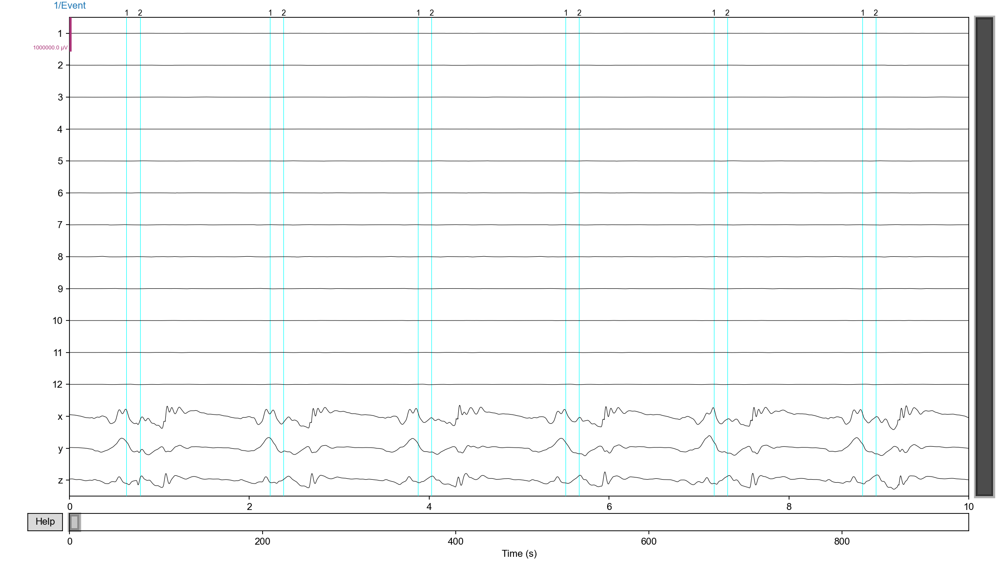

<IPython.core.display.Javascript object>


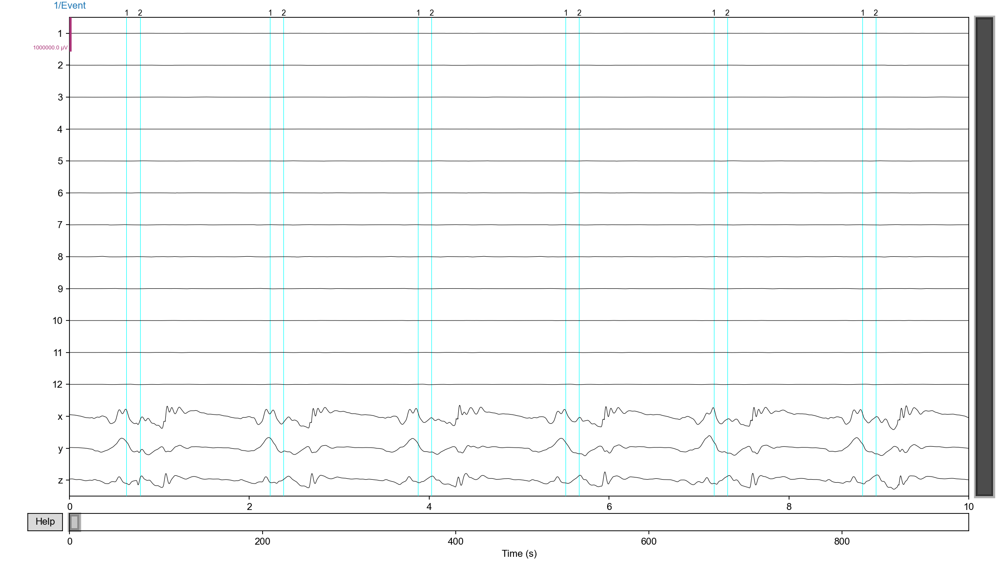

In [169]:
raw_data.plot(events,scalings={'eeg':5e-1})

In [170]:
raw_data_emg=raw_data.copy().drop_channels(['x','y','z'])


SAMPLING_FREQUENCY = raw_data_emg.info['sfreq']
CHANNEL_NUMBER = len(raw_data_emg.ch_names)
BANDPASS_LIMITS = (200, 500)

In [171]:
raw_hil = raw_data_emg.copy().filter(BANDPASS_LIMITS[0], BANDPASS_LIMITS[1]).apply_hilbert(envelope=True).filter(0, 20)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 2e+02 - 5e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 200.00
- Lower transition bandwidth: 50.00 Hz (-6 dB cutoff frequency: 175.00 Hz)
- Upper passband edge: 500.00 Hz
- Upper transition bandwidth: 125.00 Hz (-6 dB cutoff frequency: 562.50 Hz)
- Filter length: 133 samples (0.067 sec)

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter l

In [172]:
epochs=mne.Epochs(raw_hil, events=events, tmin=-0.3, tmax=0.0, 
                        preload=True, 
                        baseline=None).apply_hilbert(envelope=True)

Not setting metadata
Not setting metadata
1140 matching events found
No baseline correction applied
0 projection items activated
Loading data for 1140 events and 601 original time points ...
2 bad epochs dropped


In [173]:
epochs

Number of events,1138
Events,1: 5692: 569
Time range,-0.300 – 0.000 sec
Baseline,off


In [174]:
def get_features_labels(epochs):
    X=[]
    for i in range(epochs._data.shape[0]):
        channel_names = np.arange(CHANNEL_NUMBER).astype(str).tolist()
        channel_types = ['emg']*CHANNEL_NUMBER
        info = mne.create_info(channel_names, SAMPLING_FREQUENCY, channel_types)
        raw = mne.io.RawArray(epochs._data[i], info, verbose=False)
        raw.filter(BANDPASS_LIMITS[0], BANDPASS_LIMITS[1], picks=['emg'], n_jobs=4)
        x__=[]
        # Mean absolute value
        for channel in raw.get_data():
            x__.append(channel.mean())
        # Matematical expactation
        for channel in raw.get_data():
            x__.append(channel.std())
        # Variance
        for channel in raw.get_data():
            x__.append(channel.var())
        # Waveform length
        for channel in raw.get_data():
            x__.append(np.sum(np.diff(channel, n=1)))
        # Number pf peaks
        for channel in raw.get_data():
            x__.append(len(find_peaks(channel)))
        
        # Append PCA of epoch data
        pca = PCA(6)
        pv = pca.fit_transform(epochs._data[i])
                         
        X.append(x__)
    X = np.array(X).squeeze()
    y = epochs.events[:,-1].flatten()
    return X, y


In [175]:

X, y = get_features_labels(epochs)

print('X: ', X.shape)
print('Y: ', y.shape)
#classifier = SVC(C=0.8, kernel='rbf', probability=True)
# cross_val_score(classifier, X, y, cv=3)
#classifier.fit(X, y)
#classifier.score(X, y)

X:  (1138, 60)
Y:  (1138,)


In [176]:
import numpy as np
from sklearn.model_selection import TimeSeriesSplit

In [178]:
classifier = SVC(C=0.8, kernel='rbf', probability=True)
#cross_val_score(classifier, X, y, cv=3)
classifier.fit(X, y)
classifier.score(X, y)

0.7583479789103691

In [180]:
tscv=TimeSeriesSplit(max_train_size=None, n_splits=4)
for train_index, test_index in tscv.split(X):
    print()
    #print("TRAIN:", train_index, "TEST:", test_index) 
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    print("TRAIN:", X_train.shape,y_train.shape )
    print("TEST:", X_test.shape, y_test.shape) 
    
    
    classifier.fit(X_train, y_train)
    ac=classifier.score(X_test, y_test)
    print('Accuracy:', ac)
    


TRAIN: (230, 60) (230,)
TEST: (227, 60) (227,)
Accuracy: 0.43171806167400884

TRAIN: (457, 60) (457,)
TEST: (227, 60) (227,)
Accuracy: 0.7400881057268722

TRAIN: (684, 60) (684,)
TEST: (227, 60) (227,)
Accuracy: 0.8458149779735683

TRAIN: (911, 60) (911,)
TEST: (227, 60) (227,)
Accuracy: 0.8237885462555066


In [183]:
zeros=[0]*len(events_max)
marks=[3]*len(events_max)

threes=np.vstack([np.array(events_max)+700,zeros,marks]).T

#twos=np.vstack([events_max,zeros,marks]).T



In [184]:

events=np.vstack([ones,twos, threes])
events=events[events[:, 0].argsort()]


<IPython.core.display.Javascript object>


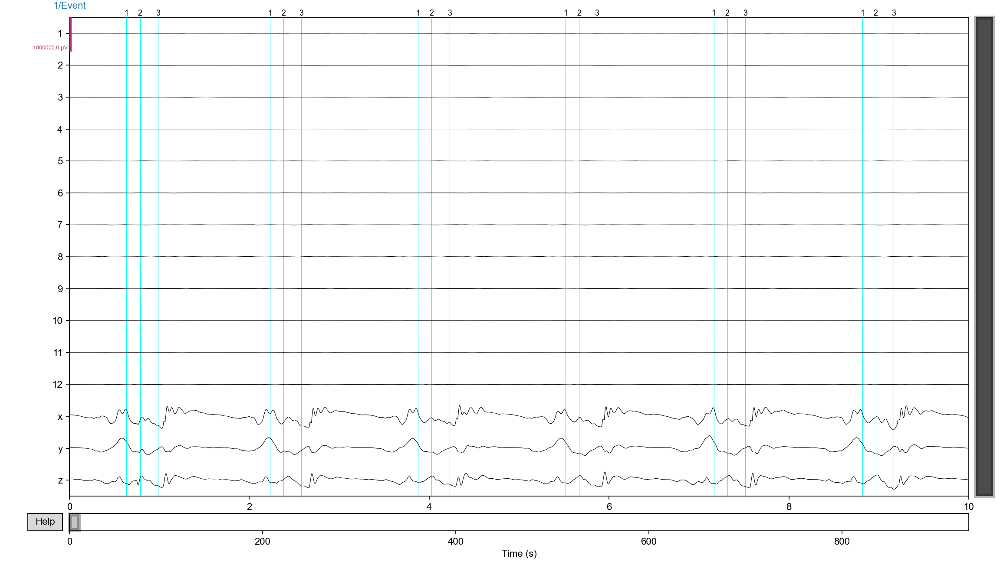

<IPython.core.display.Javascript object>


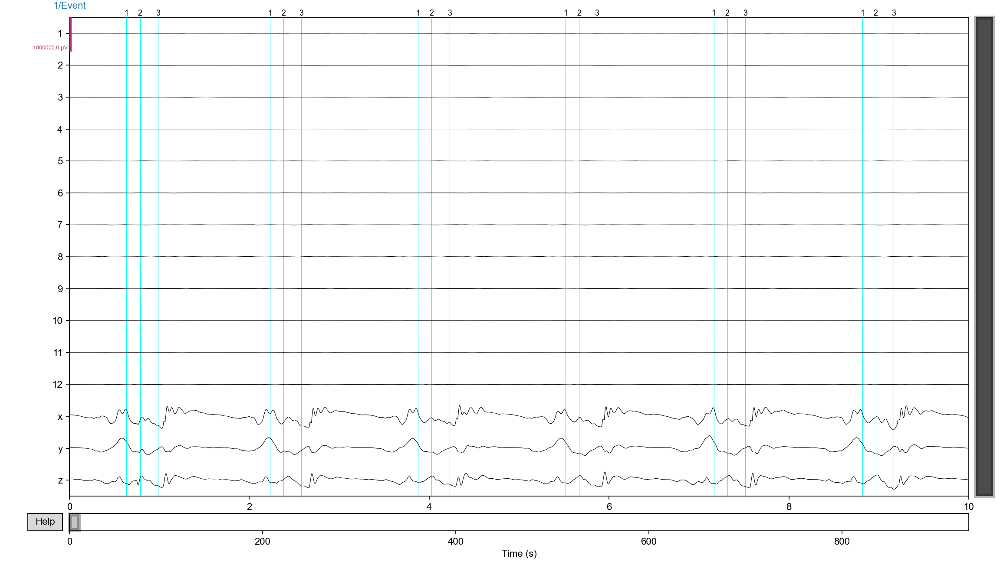

In [186]:
raw_data.plot(events,scalings={'eeg':5e-1})

In [187]:
epochs=mne.Epochs(raw_hil, events=events, tmin=-0.5, tmax=0.0, 
                        preload=True, 
                        baseline=None).apply_hilbert(envelope=True)

Not setting metadata
Not setting metadata
1710 matching events found
No baseline correction applied
0 projection items activated
Loading data for 1710 events and 1001 original time points ...
3 bad epochs dropped


In [188]:

X, y = get_features_labels(epochs)

print('X: ', X.shape)
print('Y: ', y.shape)
#classifier = SVC(C=0.8, kernel='rbf', probability=True)
# cross_val_score(classifier, X, y, cv=3)
#classifier.fit(X, y)
#classifier.score(X, y)

X:  (1707, 60)
Y:  (1707,)


In [189]:
classifier = SVC(C=0.8, kernel='rbf', probability=True)
#cross_val_score(classifier, X, y, cv=3)
classifier.fit(X, y)
classifier.score(X, y)

0.6379613356766256

In [208]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib

In [221]:
matplotlib.rcParams.update

<bound method MutableMapping.update of RcParams({'_internal.classic_mode': False,
          'agg.path.chunksize': 0,
          'animation.avconv_args': [],
          'animation.avconv_path': 'avconv',
          'animation.bitrate': -1,
          'animation.codec': 'h264',
          'animation.convert_args': [],
          'animation.convert_path': 'convert',
          'animation.embed_limit': 20.0,
          'animation.ffmpeg_args': [],
          'animation.ffmpeg_path': 'ffmpeg',
          'animation.frame_format': 'png',
          'animation.html': 'none',
          'animation.html_args': [],
          'animation.writer': 'ffmpeg',
          'axes.autolimit_mode': 'data',
          'axes.axisbelow': True,
          'axes.edgecolor': 'white',
          'axes.facecolor': '0.9',
          'axes.formatter.limits': [-5, 6],
          'axes.formatter.min_exponent': 0,
          'axes.formatter.offset_threshold': 4,
          'axes.formatter.use_locale': False,
          'axes.formatter.use_

In [242]:
def conf_matrix_plot(categs, matrix_bef, size=3,perc_flg=True):
    
    group_percentages = ["{0:.2%}".format(value) for value in
                     matrix_bef.flatten()/np.sum(matrix_bef)]
    
    if perc_flg:
        labels = np.asarray(group_percentages).reshape(size,size)
    else:
        labels =matrix_bef
    sns.set_style("darkgrid", {"axes.facecolor": "0.9"})
    matplotlib.rcParams.update({'font.size': 32})
    fig1, ax1 = plt.subplots(figsize=[10,8])
    sns.heatmap(matrix_bef,cmap='Blues',xticklabels=categs,yticklabels=categs,annot=labels, fmt='',ax=ax1)

    #matplotlib.rcParams.update({'font.size': defa})

In [213]:
categs=['Фаза-1','Фаза-2', 'Фаза-3', 'Фаза-4']

<IPython.core.display.Javascript object>


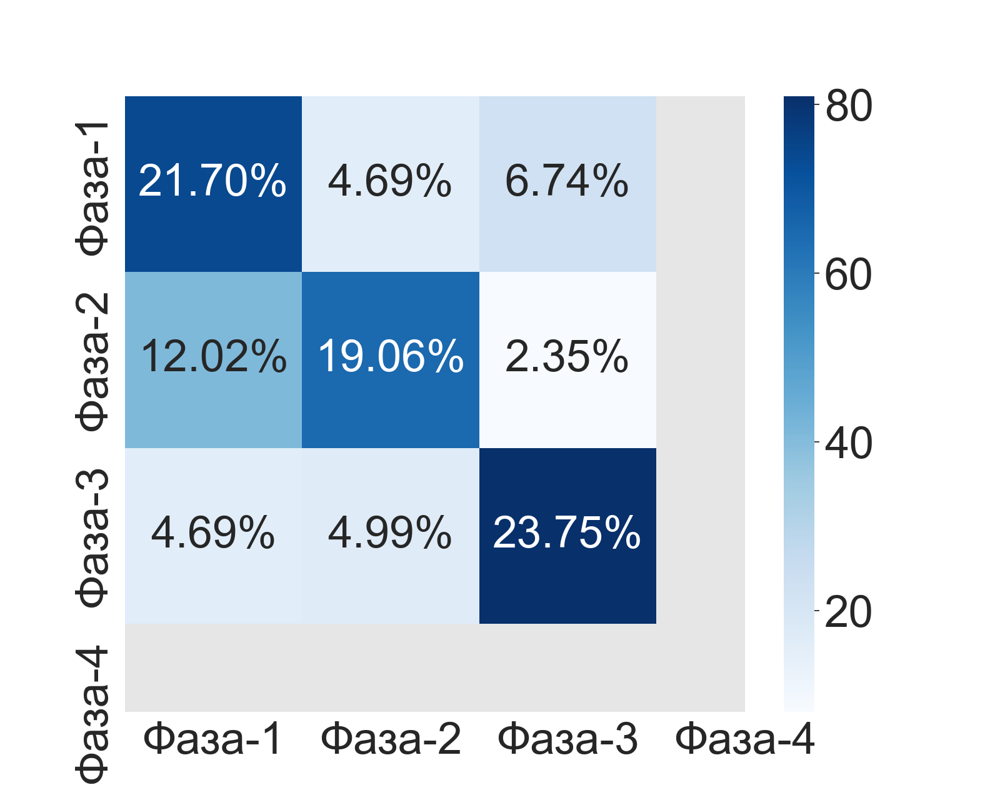

<IPython.core.display.Javascript object>


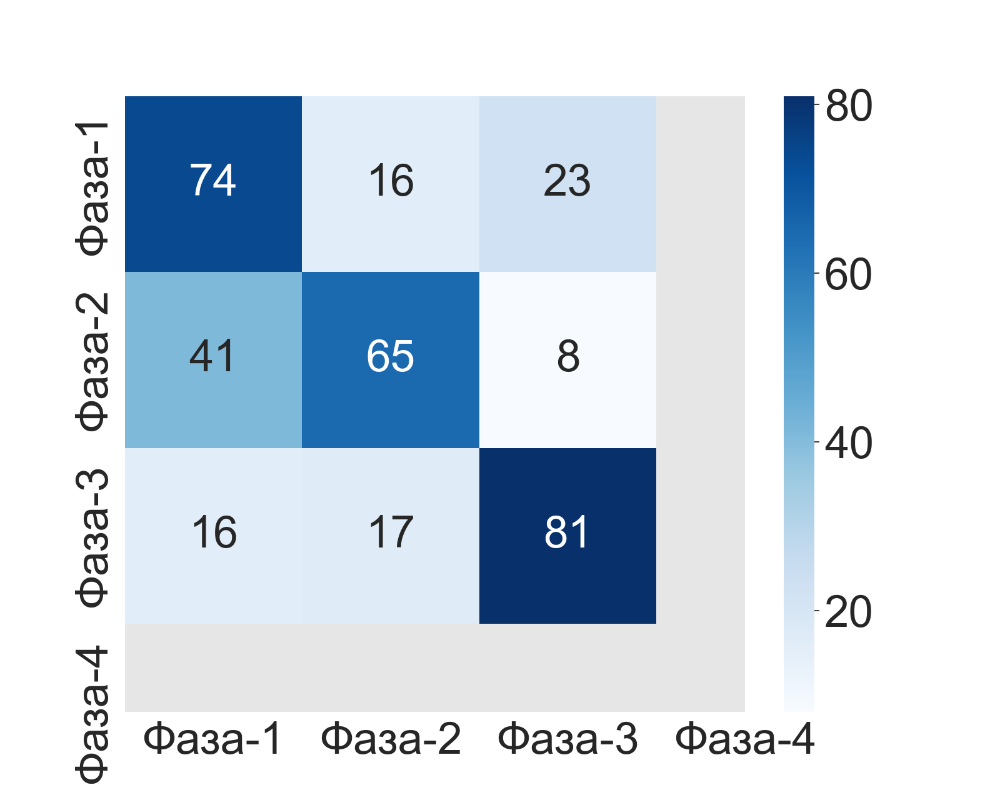

In [215]:
conf_matrix_plot(categs, matrix)
conf_matrix_plot(categs, matrix , perc_flg=False)

In [216]:
tscv=TimeSeriesSplit(max_train_size=None, n_splits=4)
for train_index, test_index in tscv.split(X):
    print()
    #print("TRAIN:", train_index, "TEST:", test_index) 
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    print("TRAIN:", X_train.shape,y_train.shape )
    print("TEST:", X_test.shape, y_test.shape) 
    
    
    classifier.fit(X_train, y_train)
    ac=classifier.score(X_test, y_test)
    print('Accuracy:', ac)
    
    
    preds=classifier.predict(X_test)
    matrix=confusion_matrix(y_test,preds)
    #plt.
    
    conf_matrix_plot(categs, matrix)
    conf_matrix_plot(categs, matrix , perc_flg=False)


TRAIN: (343, 60) (343,)
TEST: (341, 60) (341,)
Accuracy: 0.5571847507331378

TRAIN: (684, 60) (684,)
TEST: (341, 60) (341,)
Accuracy: 0.5043988269794721

TRAIN: (1025, 60) (1025,)
TEST: (341, 60) (341,)
Accuracy: 0.6422287390029325

TRAIN: (1366, 60) (1366,)
TEST: (341, 60) (341,)
Accuracy: 0.6451612903225806


In [218]:
zeros=[0]*len(events_max)
marks=[4]*len(events_max)

fores=np.vstack([np.array(events_max)+1400,zeros,marks]).T

#twos=np.vstack([events_max,zeros,marks]).T




In [232]:

events=np.vstack([ones,twos, threes, fores])
events=events[events[:, 0].argsort()]


<IPython.core.display.Javascript object>


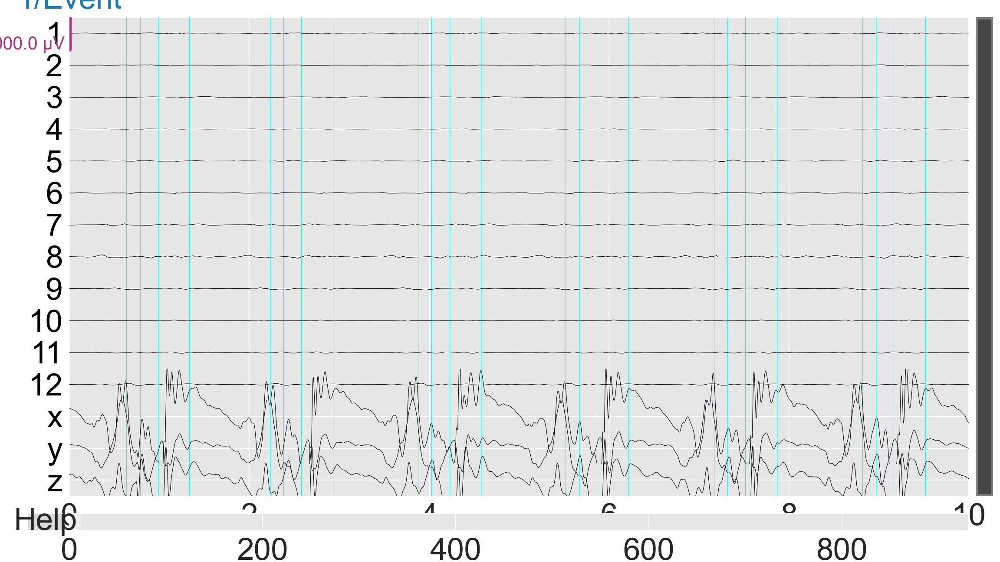

<IPython.core.display.Javascript object>


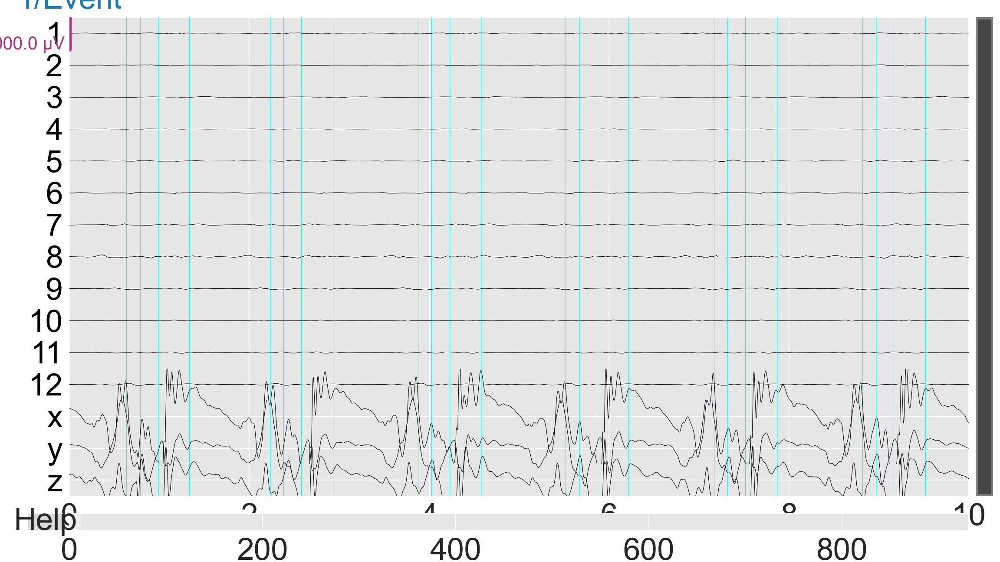

In [230]:
raw_data.plot(events,scalings={'eeg':0.1e0})

In [233]:
epochs=mne.Epochs(raw_hil, events=events, tmin=-0.3, tmax=0.0, 
                        preload=True, 
                        baseline=None).apply_hilbert(envelope=True)

Not setting metadata
Not setting metadata
2280 matching events found
No baseline correction applied
0 projection items activated
Loading data for 2280 events and 601 original time points ...
4 bad epochs dropped


In [234]:

X, y = get_features_labels(epochs)

print('X: ', X.shape)
print('Y: ', y.shape)
#classifier = SVC(C=0.8, kernel='rbf', probability=True)
# cross_val_score(classifier, X, y, cv=3)
#classifier.fit(X, y)
#classifier.score(X, y)

X:  (2276, 60)
Y:  (2276,)


In [237]:
classifier = SVC(C=0.8, kernel='rbf', probability=True)
#cross_val_score(classifier, X, y, cv=3)
classifier.fit(X, y)
classifier.score(X, y)

0.484182776801406


TRAIN: (456, 60) (456,)
TEST: (455, 60) (455,)
Accuracy: 0.3648351648351648


<IPython.core.display.Javascript object>


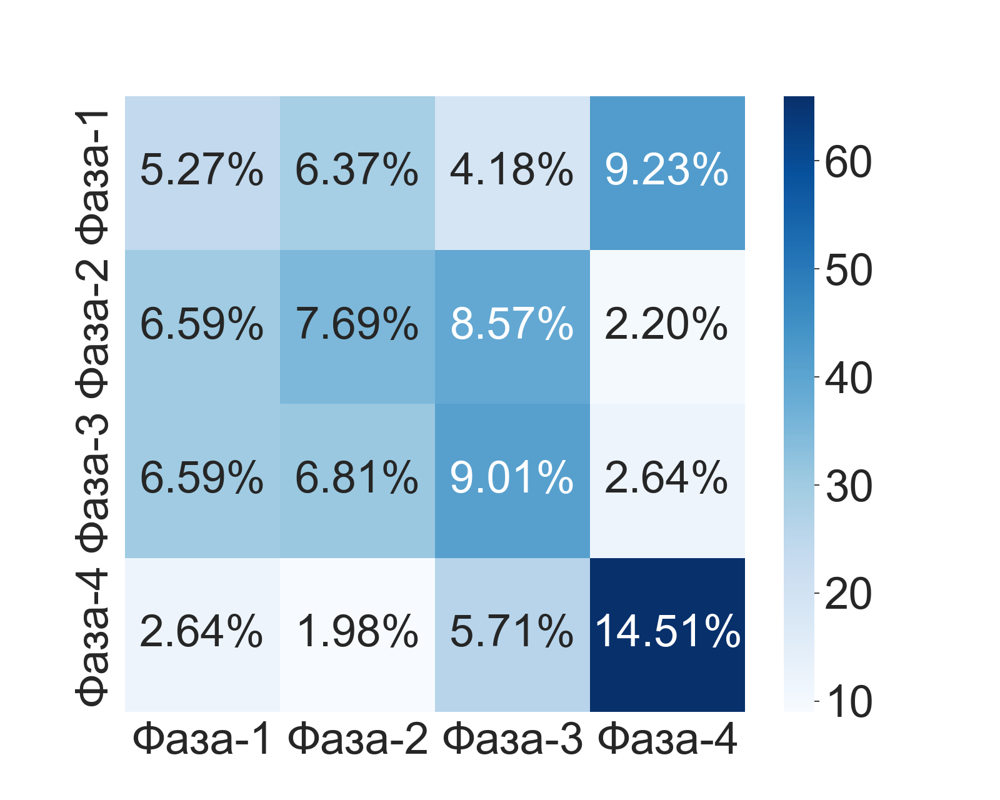

<IPython.core.display.Javascript object>


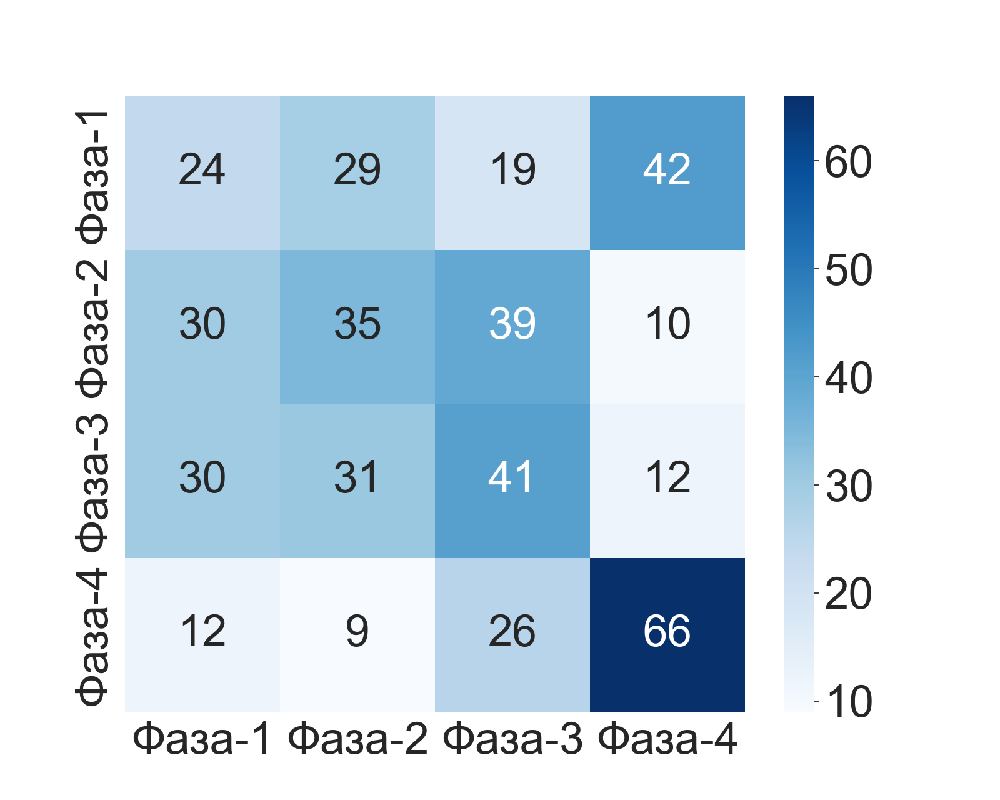


TRAIN: (911, 60) (911,)
TEST: (455, 60) (455,)
Accuracy: 0.3362637362637363


<IPython.core.display.Javascript object>


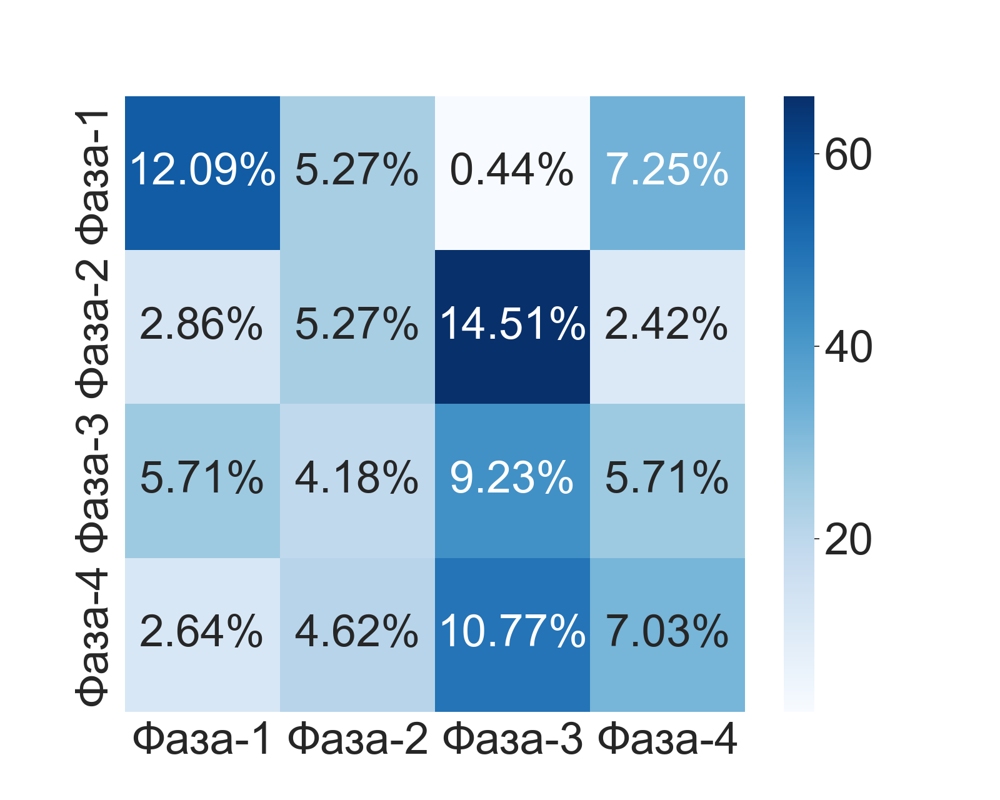

<IPython.core.display.Javascript object>


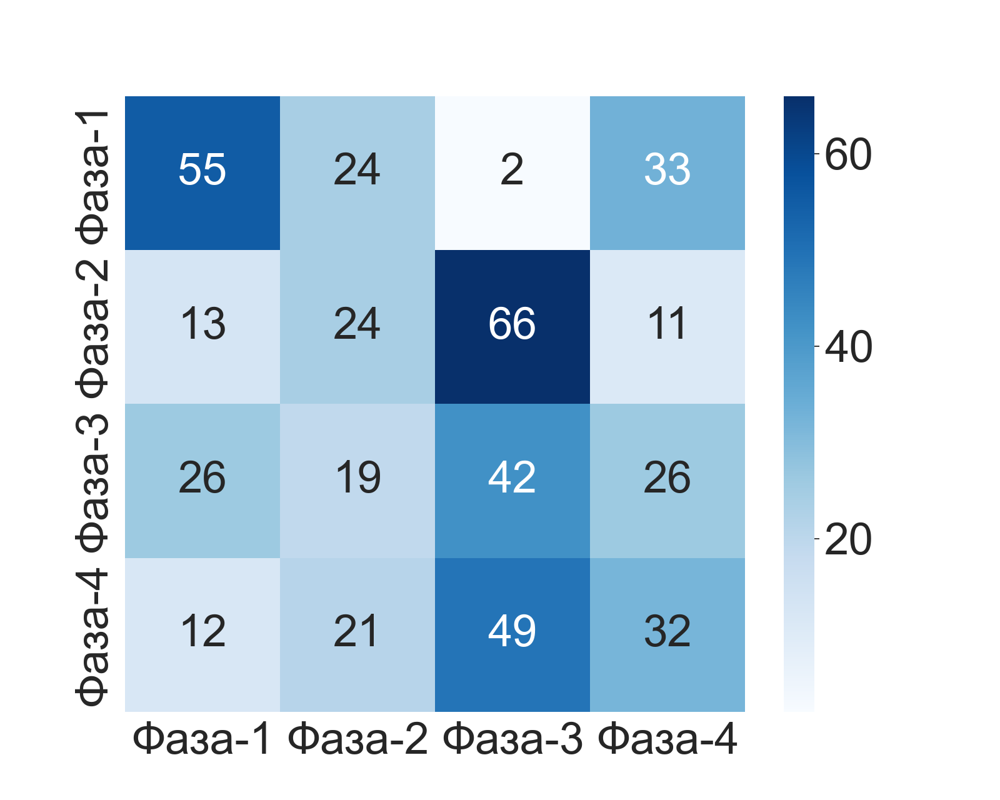


TRAIN: (1366, 60) (1366,)
TEST: (455, 60) (455,)
Accuracy: 0.4


<IPython.core.display.Javascript object>


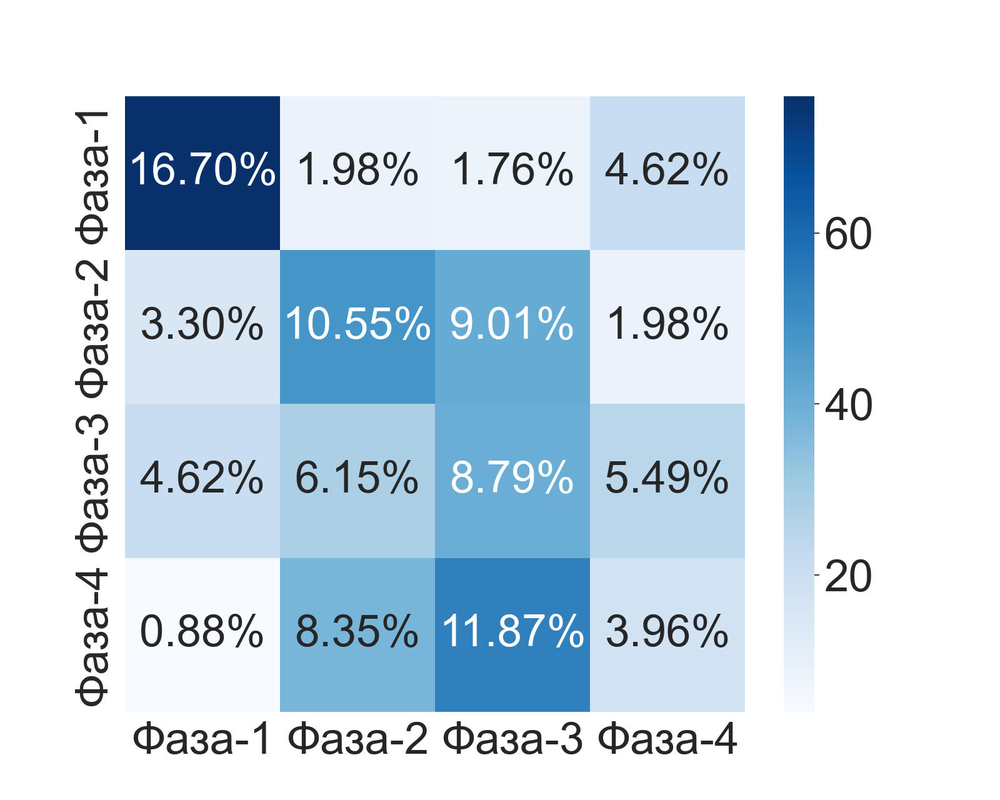

<IPython.core.display.Javascript object>


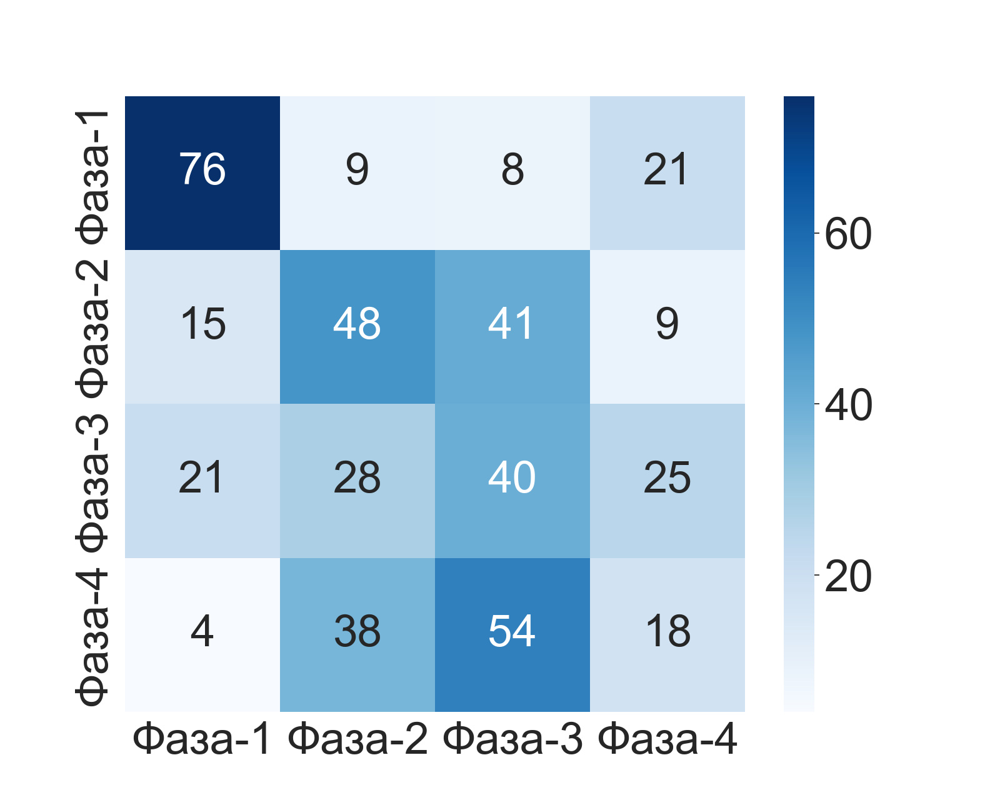


TRAIN: (1821, 60) (1821,)
TEST: (455, 60) (455,)
Accuracy: 0.46813186813186813


<IPython.core.display.Javascript object>


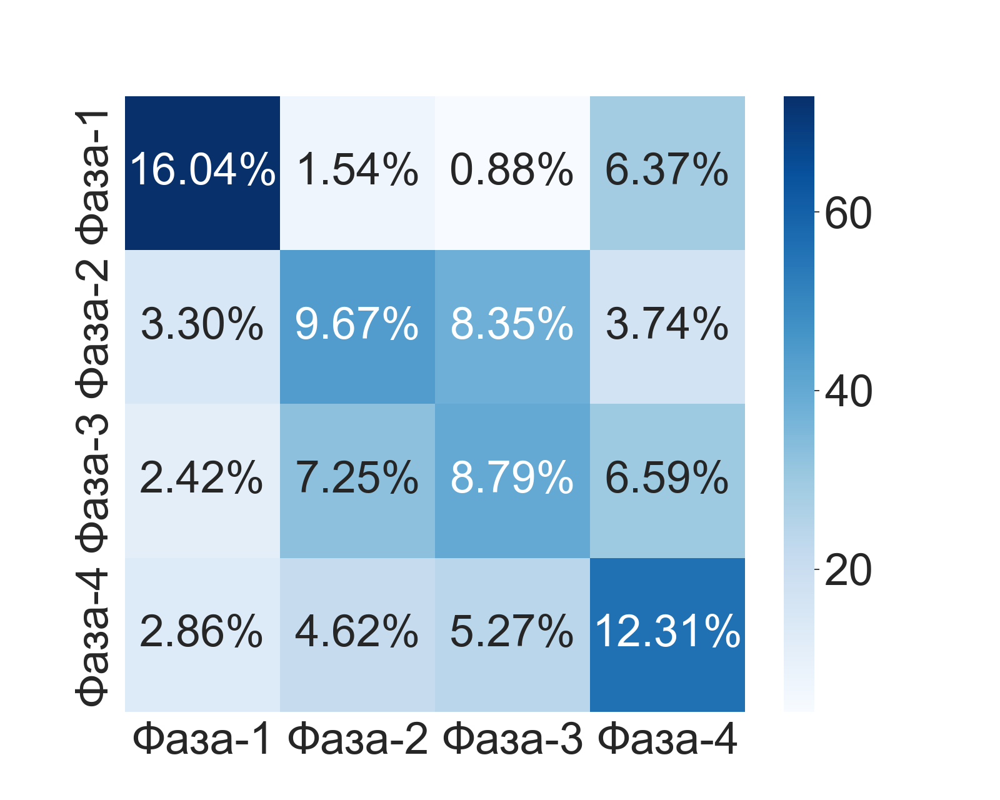

<IPython.core.display.Javascript object>


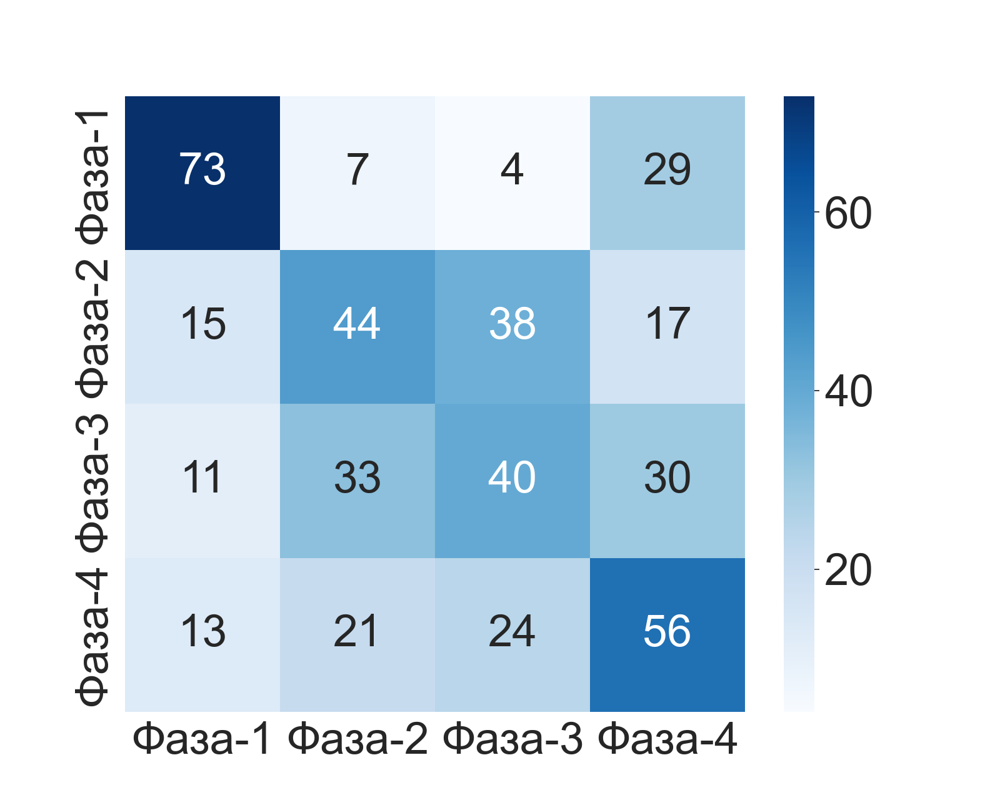

In [243]:
tscv=TimeSeriesSplit(max_train_size=None, n_splits=4)
for train_index, test_index in tscv.split(X):
    print()
    #print("TRAIN:", train_index, "TEST:", test_index) 
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    print("TRAIN:", X_train.shape,y_train.shape )
    print("TEST:", X_test.shape, y_test.shape) 
    
    
    classifier.fit(X_train, y_train)
    ac=classifier.score(X_test, y_test)
    print('Accuracy:', ac)
    
    
    preds=classifier.predict(X_test)
    matrix=confusion_matrix(y_test,preds)
    #plt.
    
    conf_matrix_plot(categs, matrix, size=4)
    conf_matrix_plot(categs, matrix , perc_flg=False,size=4)